In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from dynadojo.systems.gilpin_flows import GilpinFlowsSystem
from dynadojo.wrappers import SystemChecker, AlgorithmChecker
from dynadojo.utils.lds import plot
from dynadojo.baselines.sindy import SINDy
from dynadojo.challenges import FixedComplexity
from dynadojo.baselines.lr import LinearRegression

(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

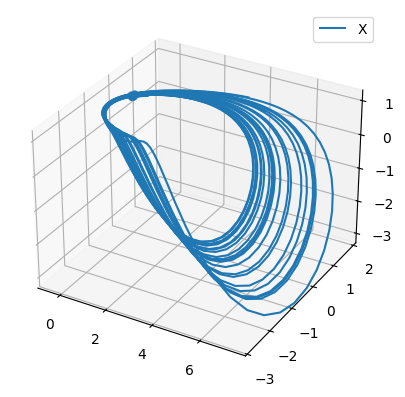

In [4]:
# plotting in-distribution trajectories
n=10
timesteps = 250
system = SystemChecker(GilpinFlowsSystem(system_name='SprottJerk', pts_per_period=80, seed=42))
x0 = system.make_init_conds(n)
x = system.make_data(x0, timesteps=timesteps)
plot([x], labels=["X"])

(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

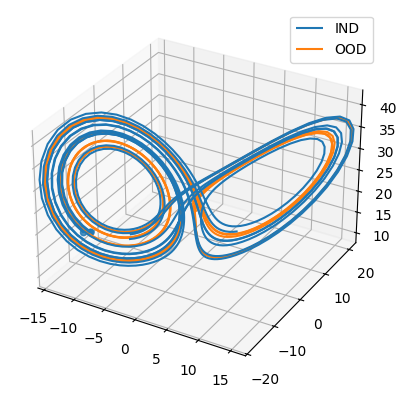

In [5]:
# plotting in-distribution and out-of-distribution trajectories
n = 5
test_size = 3
timesteps = 300
system = SystemChecker(GilpinFlowsSystem())
x0 = system.make_init_conds(n)
y0 = system.make_init_conds(10, in_dist=False)
x = system.make_data(x0, timesteps=timesteps)
y = system.make_data(y0, timesteps=timesteps, noisy=True)
plot([x, y], target_dim=3, labels=["IND", "OOD"], max_lines=test_size)

(5, 1, 3)
(10, 1, 3)


(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

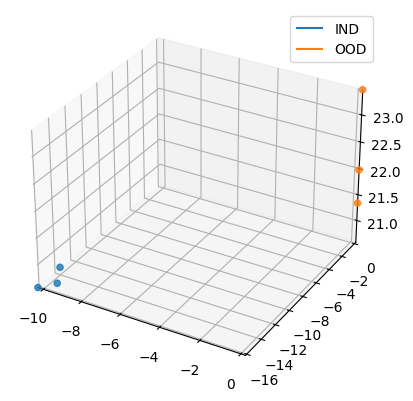

In [6]:
# plotting in-distribution and out-of-distribution initial conditions
import numpy as np

x0_3d = np.expand_dims(x0, axis=1)
y0_3d = np.expand_dims(y0, axis=1)

print(x0_3d.shape)
print(y0_3d.shape)

plot([x0_3d, y0_3d], target_dim=3, labels=["IND", "OOD"], max_lines=test_size)

y_err=0.9170569946120333


(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

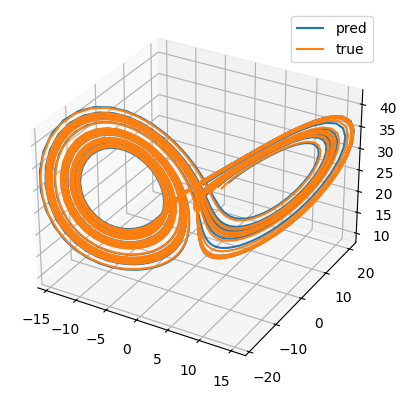

In [7]:
embed_dim = 3
sindy = AlgorithmChecker(SINDy(embed_dim, timesteps, max_control_cost=0, seed=100))
sindy.fit(x)
y_pred = sindy.predict(y[:, 0], timesteps)
y_err = system.calc_error(y, y_pred)
print(f"{y_err=}")
plot([y_pred, y], target_dim=3, labels=["pred", "true"], max_lines=15)

In [8]:
challenge = FixedComplexity(
    N=[10, 50, 100, 500],
    l=3,
    e=3,
    t=50,
    control_horizons=0,
    max_control_cost_per_dim=0,
    system_cls=GilpinFlowsSystem,
    trials=10,
    test_examples=50,
    test_timesteps=50,
    system_kwargs={"system_name": "Lorenz"},
)
data = challenge.evaluate(LinearRegression, id="linear regression")

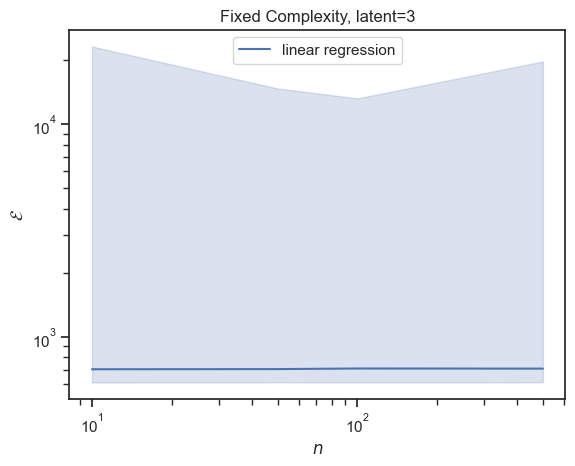

<Axes: title={'center': 'Fixed Complexity, latent=3'}, xlabel='$n$', ylabel='$\\mathcal{E}$'>

In [9]:
challenge.plot(data)

Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 5. Adjusting the embedded dimension to 5.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 5. Adjusting the latent dimension to 5.
Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 6. Adjusting the embedded dimension to 6.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 6. Adjusting the latent dimension to 6.


/Users/laurenmclane/dynadojo/src/dynadojo/utils/lds.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 5. Adjusting the embedded dimension to 5.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 5. Adjusting the latent dimension to 5.
Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 4. Adjusting the embedded dimension to 4.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 4. Adjusting the latent dimension to 4.


/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1565: RuntimeWarning: overflow encountered in exp
  alpham = 0.1 * (25 + v) / (1 - np.exp(-0.1 * v - 2.5))
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1566: RuntimeWarning: overflow encountered in exp
  betam = 4 * np.exp(-(v + 50) / 18)
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1569: RuntimeWarning: overflow encountered in exp
  alphah = 0.07 * np.exp(-0.05 * v - 2.5)
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1570: RuntimeWarning: overflow encountered in exp
  betah = 1 / (1 + np.exp(-0.1 * v - 2))
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1571: RuntimeWarning: invalid value encountered in scalar divide
  hinf = alphah / (alphah + betah)
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1573: RuntimeWarning: overflow encountered in exp

Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 4. Adjusting the embedded dimension to 4.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 4. Adjusting the latent dimension to 4.
Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 6. Adjusting the embedded dimension to 6.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 6. Adjusting the latent dimension to 6.
Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 4. Adjusting the embedded dimension to 4.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 4. Adjusting the latent dimension to 4.
Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 4. Adjusting the embedded dimension to 4.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 4. Adjusting the latent dimension to 4.
Inputted embedded dimension of 3, but Gilpin's system ha

/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:537: RuntimeWarning: overflow encountered in exp
  zdot = -z - x - eps * (np.exp(y / y0) - 1)


Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 4. Adjusting the embedded dimension to 4.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 4. Adjusting the latent dimension to 4.
Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 6. Adjusting the embedded dimension to 6.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 6. Adjusting the latent dimension to 6.
Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 4. Adjusting the embedded dimension to 4.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 4. Adjusting the latent dimension to 4.
Inputted embedded dimension of 3, but Gilpin's system has an embedded dimension of 10. Adjusting the embedded dimension to 10.
Inputted latent dimension of 3, but Gilpin's system has a dimension of 10. Adjusting the latent dimension to 10.
Inputted embedded dimension of 3, but Gilpin's syste

/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:566: RuntimeWarning: invalid value encountered in scalar power
  vsw ** 2 - p ** (5 / 4) * vsw ** (1 / 2) * (1 + np.tanh(d1 * (i - 1))) / 2
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1314: RuntimeWarning: overflow encountered in exp
  zdot = np.exp(x * y) - d * z


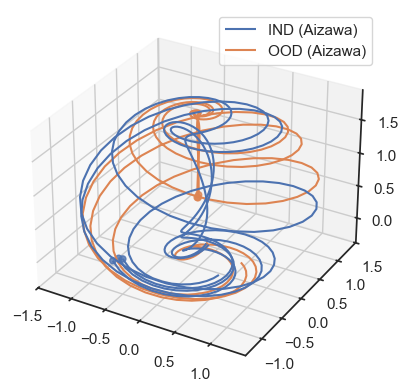

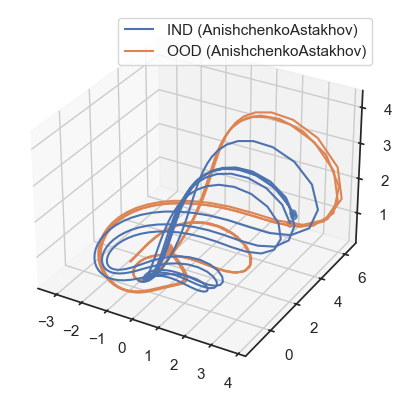

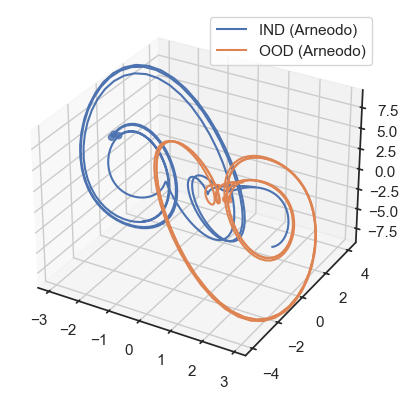

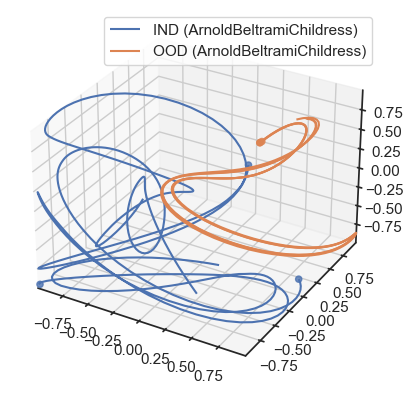

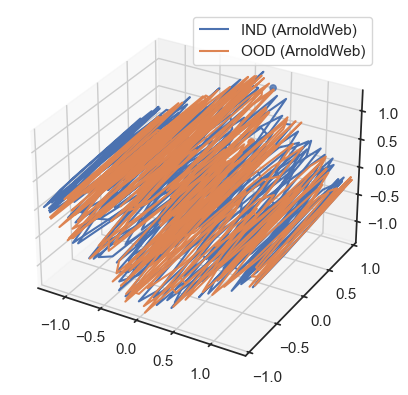

...

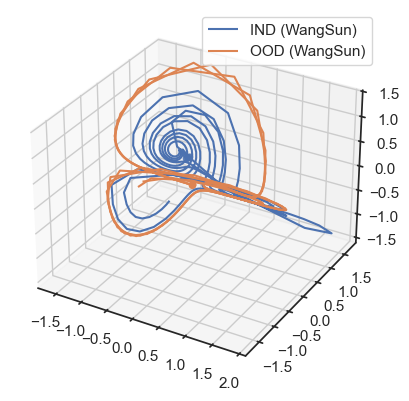

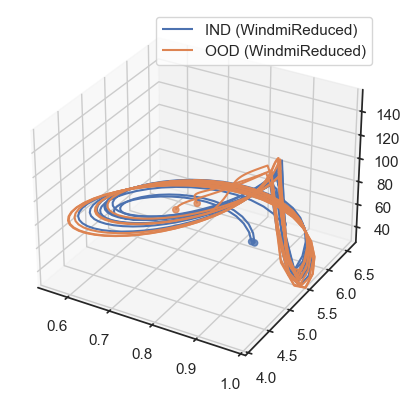

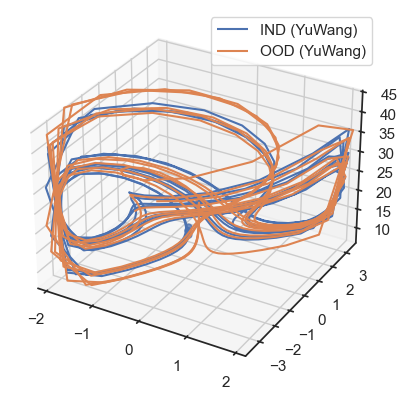

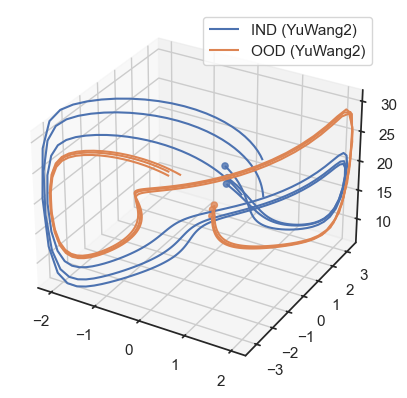

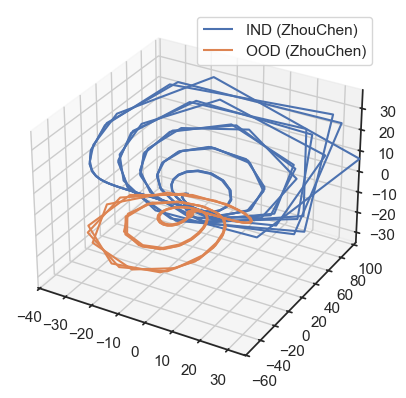

In [10]:
# plot in-distribution and out-of-distribution trajectories for all Gilpin systems
for name in GilpinFlowsSystem.all_systems():
    system = SystemChecker(GilpinFlowsSystem(system_name=name, pts_per_period=50))
    x0 = system.make_init_conds(n)
    y0 = system.make_init_conds(5, in_dist=False)
    x = system.make_data(x0, timesteps=150)
    y = system.make_data(y0, timesteps=150)
    labels = [f"IND ({name})", f"OOD ({name})"]
    plot([x, y], target_dim=3, labels=labels, max_lines=test_size)